# Customer-Satisfaction-Prediction

In [1]:
# Import necessary libraries

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt 
%matplotlib inline

# make with this report 
import pandas_profiling

# gnore all warnings
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")


# preprocessing imports 
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA


# Alogrithim 
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, HistGradientBoostingClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis


# Hyperpearmeter turning 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier


## model accuary metrices 
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score


## dorp the model in pickle 
import pickle

C:\Users\ASUS\AppData\Local\Temp\ipykernel_4552\2396068776.py:10: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


# Load the data

In [2]:
# Load the data into a DataFrame
df = pd.read_csv('D:\Customer-Satisfaction-Prediction\data\customer_support_tickets.csv')

In [3]:
df.head(3)

,Ticket ID,Customer Name,Customer Email,Customer Age,Customer Gender,Product Purchased,Date of Purchase,Ticket Type,Ticket Subject,Ticket Description,Ticket Status,Resolution,Ticket Priority,Ticket Channel,First Response Time,Time to Resolution,Customer Satisfaction Rating
0,1,Marisa Obrien,carrollallison@example.com,32,Other,GoPro Hero,2021-03-22,Technical issue,Product setup,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Social media,2023-06-01 12:15:36,NaN,NaN
1,2,Jessica Rios,clarkeashley@example.com,42,Female,LG Smart TV,2021-05-22,Technical issue,Peripheral compatibility,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Chat,2023-06-01 16:45:38,NaN,NaN
2,3,Christopher Robbins,gonzalestracy@example.com,48,Other,Dell XPS,2020-07-14,Technical issue,Network problem,I'm facing a problem with my {product_purchase...,Closed,Case maybe show recently my computer follow.,Low,Social media,2023-06-01 11:14:38,2023-06-01 18:05:38,3.0


In [4]:
from ydata_profiling import ProfileReport
# Create the profile report
profile = ProfileReport(df, title="Customer Satisfaction Data Report", explorative=True)

# Display report inside Jupyter Notebook
display(profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.head(2)

,Ticket ID,Customer Name,Customer Email,Customer Age,Customer Gender,Product Purchased,Date of Purchase,Ticket Type,Ticket Subject,Ticket Description,Ticket Status,Resolution,Ticket Priority,Ticket Channel,First Response Time,Time to Resolution,Customer Satisfaction Rating
0,1,Marisa Obrien,carrollallison@example.com,32,Other,GoPro Hero,2021-03-22,Technical issue,Product setup,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Social media,2023-06-01 12:15:36,NaN,NaN
1,2,Jessica Rios,clarkeashley@example.com,42,Female,LG Smart TV,2021-05-22,Technical issue,Peripheral compatibility,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Chat,2023-06-01 16:45:38,NaN,NaN


In [6]:
print(df.columns)

Index(['Ticket ID', 'Customer Name', 'Customer Email', 'Customer Age',
       'Customer Gender', 'Product Purchased', 'Date of Purchase',
       'Ticket Type', 'Ticket Subject', 'Ticket Description', 'Ticket Status',
       'Resolution', 'Ticket Priority', 'Ticket Channel',
       'First Response Time', 'Time to Resolution',
       'Customer Satisfaction Rating'],
      dtype='object')


In [7]:
## cheking the shape
df.shape

(8469, 17)

In [8]:
## checking info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticket ID                     8469 non-null   int64  
 1   Customer Name                 8469 non-null   object 
 2   Customer Email                8469 non-null   object 
 3   Customer Age                  8469 non-null   int64  
 4   Customer Gender               8469 non-null   object 
 5   Product Purchased             8469 non-null   object 
 6   Date of Purchase              8469 non-null   object 
 7   Ticket Type                   8469 non-null   object 
 8   Ticket Subject                8469 non-null   object 
 9   Ticket Description            8469 non-null   object 
 10  Ticket Status                 8469 non-null   object 
 11  Resolution                    2769 non-null   object 
 12  Ticket Priority               8469 non-null   object 
 13  Tic

In [9]:
## checking the values of the data
null_values = df.isnull().sum()

print(f"null values: \n {null_values}")

null values: 
 Ticket ID                          0
Customer Name                      0
Customer Email                     0
Customer Age                       0
Customer Gender                    0
Product Purchased                  0
Date of Purchase                   0
Ticket Type                        0
Ticket Subject                     0
Ticket Description                 0
Ticket Status                      0
Resolution                      5700
Ticket Priority                    0
Ticket Channel                     0
First Response Time             2819
Time to Resolution              5700
Customer Satisfaction Rating    5700
dtype: int64


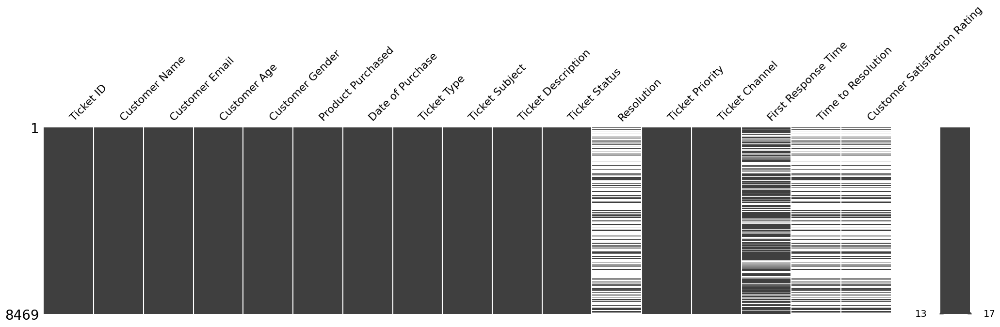

In [10]:
# How many missing values are there in our dataset?
import missingno as msno
msno.matrix(df, figsize = (25,5))
plt.show()

In [11]:
# Checking the percentage of missing values
missing_percent = (df.isnull().sum() / len(df)) * 100

# Display the missing values percentage
print("Percentage of Missing Values:\n")
print(missing_percent)


Percentage of Missing Values:

Ticket ID                        0.000000
Customer Name                    0.000000
Customer Email                   0.000000
Customer Age                     0.000000
Customer Gender                  0.000000
Product Purchased                0.000000
Date of Purchase                 0.000000
Ticket Type                      0.000000
Ticket Subject                   0.000000
Ticket Description               0.000000
Ticket Status                    0.000000
Resolution                      67.304286
Ticket Priority                  0.000000
Ticket Channel                   0.000000
First Response Time             33.286102
Time to Resolution              67.304286
Customer Satisfaction Rating    67.304286
dtype: float64


# Data Preprocessing

This code drops columns with excessive missing values and imputes missing values in essential columns using the median to maintain data integrity.

In [12]:
df.head(3)

,Ticket ID,Customer Name,Customer Email,Customer Age,Customer Gender,Product Purchased,Date of Purchase,Ticket Type,Ticket Subject,Ticket Description,Ticket Status,Resolution,Ticket Priority,Ticket Channel,First Response Time,Time to Resolution,Customer Satisfaction Rating
0,1,Marisa Obrien,carrollallison@example.com,32,Other,GoPro Hero,2021-03-22,Technical issue,Product setup,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Social media,2023-06-01 12:15:36,NaN,NaN
1,2,Jessica Rios,clarkeashley@example.com,42,Female,LG Smart TV,2021-05-22,Technical issue,Peripheral compatibility,I'm having an issue with the {product_purchase...,Pending Customer Response,NaN,Critical,Chat,2023-06-01 16:45:38,NaN,NaN
2,3,Christopher Robbins,gonzalestracy@example.com,48,Other,Dell XPS,2020-07-14,Technical issue,Network problem,I'm facing a problem with my {product_purchase...,Closed,Case maybe show recently my computer follow.,Low,Social media,2023-06-01 11:14:38,2023-06-01 18:05:38,3.0


To predict Customer Satisfaction Rating, we should select features that are likely to influence customer satisfaction. Based on this dataset, the following columns seem useful for making a predictive model:


 <ul>
        <li><strong>Customer Age</strong> – Older or younger customers may have different satisfaction levels.</li>
        <li><strong>Customer Gender</strong> – Satisfaction may vary based on gender preferences.</li>
        <li><strong>Product Purchased</strong> – Different products may have different satisfaction levels.</li>
        <li><strong>Ticket Type</strong> – Some ticket types (e.g., billing issues) might lead to lower satisfaction.</li>
        <li><strong>Ticket Subject</strong> – The topic of the issue may affect satisfaction.</li>
        <li><strong>Ticket Status</strong> – Resolved vs. pending tickets can impact satisfaction.</li>
        <li><strong>Ticket Priority</strong> – High-priority issues might correlate with satisfaction.</li>
        <li><strong>Ticket Channel</strong> – Some channels (e.g., chat vs. email) may lead to different satisfaction levels.</li>
        <li><strong>First Response Time</strong> – Faster responses generally improve satisfaction.</li>
        <li><strong>Date of Purchase</strong></li>
        <li><strong>Customer Satisfaction Rating</strong></li>
    </ul>

In [13]:
# Select Useful Features
selected_features = [
    'Customer Age', 'Customer Gender','Product Purchased','Date of Purchase','Ticket Type', 
    'Ticket Subject', 'Ticket Status', 'Ticket Priority', 'Ticket Channel', 
    'First Response Time', 'Customer Satisfaction Rating'  # Corrected
]

# Store selected features in a new DataFrame
df_selected = df[selected_features]
df = df_selected
# Display the first few rows of the new DataFrame
df_selected.head()



,Customer Age,Customer Gender,Product Purchased,Date of Purchase,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,First Response Time,Customer Satisfaction Rating
0,32,Other,GoPro Hero,2021-03-22,Technical issue,Product setup,Pending Customer Response,Critical,Social media,2023-06-01 12:15:36,NaN
1,42,Female,LG Smart TV,2021-05-22,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,2023-06-01 16:45:38,NaN
2,48,Other,Dell XPS,2020-07-14,Technical issue,Network problem,Closed,Low,Social media,2023-06-01 11:14:38,3.0
3,27,Female,Microsoft Office,2020-11-13,Billing inquiry,Account access,Closed,Low,Social media,2023-06-01 07:29:40,3.0
4,67,Female,Autodesk AutoCAD,2020-02-04,Billing inquiry,Data loss,Closed,Low,Email,2023-06-01 00:12:42,1.0


In [14]:
## checking the values of the data
null_values = df.isnull().sum()

print(f"null values: \n {null_values}")

null values: 
 Customer Age                       0
Customer Gender                    0
Product Purchased                  0
Date of Purchase                   0
Ticket Type                        0
Ticket Subject                     0
Ticket Status                      0
Ticket Priority                    0
Ticket Channel                     0
First Response Time             2819
Customer Satisfaction Rating    5700
dtype: int64


In [15]:

# Get value counts (probability distribution)
rating_probs = df['Customer Satisfaction Rating'].dropna().value_counts(normalize=True)

# Fill missing values with random choices based on probability distribution
missing_indices = df['Customer Satisfaction Rating'].isnull()
df.loc[missing_indices, 'Customer Satisfaction Rating'] = np.random.choice(
    rating_probs.index, 
    size=missing_indices.sum(), 
    p=rating_probs.values
)


In [16]:
## checking the values of the data
null_values = df.isnull().sum()

print(f"null values: \n {null_values}")

null values: 
 Customer Age                       0
Customer Gender                    0
Product Purchased                  0
Date of Purchase                   0
Ticket Type                        0
Ticket Subject                     0
Ticket Status                      0
Ticket Priority                    0
Ticket Channel                     0
First Response Time             2819
Customer Satisfaction Rating       0
dtype: int64


In [17]:
df['First Response Time']

0       2023-06-01 12:15:36
1       2023-06-01 16:45:38
2       2023-06-01 11:14:38
3       2023-06-01 07:29:40
4       2023-06-01 00:12:42
               ...         
8464                    NaN
8465                    NaN
8466    2023-06-01 09:44:22
8467    2023-06-01 18:28:24
8468                    NaN
Name: First Response Time, Length: 8469, dtype: object

In [18]:
# Count missing values
missing_count = df['First Response Time'].isnull().sum()
print(f"Missing Values: {missing_count}")


Missing Values: 2819


In [19]:
import pandas as pd

# Convert 'First Response Time' to datetime format
df['First Response Time'] = pd.to_datetime(df['First Response Time'])

# Calculate the median response time
median_time = df['First Response Time'].median()

# Fill missing values with the median time
df['First Response Time'].fillna(median_time, inplace=True)

# Verify if missing values are handled
print(df['First Response Time'].isnull().sum())  # Should print 0


0


In [20]:
## checking the values of the data
null_values = df.isnull().sum()

print(f"null values: \n {null_values}")

null values: 
 Customer Age                    0
Customer Gender                 0
Product Purchased               0
Date of Purchase                0
Ticket Type                     0
Ticket Subject                  0
Ticket Status                   0
Ticket Priority                 0
Ticket Channel                  0
First Response Time             0
Customer Satisfaction Rating    0
dtype: int64


In [21]:
# Check for duplicate rows
duplicates = df.duplicated().sum()
print(f"The dupicates values : {duplicates}")

The dupicates values : 0


In [22]:
# Drop duplicate rows
df = df.drop_duplicates()

# Verify if duplicates are removed
print("Duplicate values after removal:", df.duplicated().sum())

Duplicate values after removal: 0


In [23]:
df.head()

,Customer Age,Customer Gender,Product Purchased,Date of Purchase,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,First Response Time,Customer Satisfaction Rating
0,32,Other,GoPro Hero,2021-03-22,Technical issue,Product setup,Pending Customer Response,Critical,Social media,2023-06-01 12:15:36,3.0
1,42,Female,LG Smart TV,2021-05-22,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,2023-06-01 16:45:38,5.0
2,48,Other,Dell XPS,2020-07-14,Technical issue,Network problem,Closed,Low,Social media,2023-06-01 11:14:38,3.0
3,27,Female,Microsoft Office,2020-11-13,Billing inquiry,Account access,Closed,Low,Social media,2023-06-01 07:29:40,3.0
4,67,Female,Autodesk AutoCAD,2020-02-04,Billing inquiry,Data loss,Closed,Low,Email,2023-06-01 00:12:42,1.0


In [24]:
df['Date of Purchase']

0       2021-03-22
1       2021-05-22
2       2020-07-14
3       2020-11-13
4       2020-02-04
           ...    
8464    2021-12-08
8465    2020-02-22
8466    2021-08-17
8467    2021-10-16
8468    2020-06-01
Name: Date of Purchase, Length: 8469, dtype: object

In [25]:
df['First Response Time']

0      2023-06-01 12:15:36
1      2023-06-01 16:45:38
2      2023-06-01 11:14:38
3      2023-06-01 07:29:40
4      2023-06-01 00:12:42
               ...        
8464   2023-06-01 11:26:25
8465   2023-06-01 11:26:25
8466   2023-06-01 09:44:22
8467   2023-06-01 18:28:24
8468   2023-06-01 11:26:25
Name: First Response Time, Length: 8469, dtype: datetime64[ns]

In [26]:
# Convert 'Date of Purchase' to datetime format
df['Date of Purchase'] = pd.to_datetime(df['Date of Purchase'])

| Feature Name          | Description |
|----------------------|-------------|
| `Purchase_Year`       | Year of purchase |
| `Purchase_Month`      | Month of purchase |
| `Purchase_Day`        | Day of the month when the purchase happened |
| `Purchase_Weekday`    | Day of the week when the purchase happened (0 = Monday, 6 = Sunday) |
| `Response_Hour`       | Hour of first response (helps identify peak response times) |
| `Response_Minute`     | Minute of first response |
| `Response_Second`     | Second of first response |
| `Response_Weekday`    | Weekday of first response (0 = Monday, 6 = Sunday) |
| `Response_Time_Delta` | Total hours taken to respond to the ticket |


In [27]:
# Extracting features from 'Date of Purchase'
df['Purchase_Year'] = df['Date of Purchase'].dt.year
df['Purchase_Month'] = df['Date of Purchase'].dt.month
df['Purchase_Day'] = df['Date of Purchase'].dt.day
df['Purchase_Weekday'] = df['Date of Purchase'].dt.weekday  # 0 = Monday, 6 = Sunday

# Extracting features from 'First Response Time'
df['Response_Hour'] = df['First Response Time'].dt.hour
df['Response_Minute'] = df['First Response Time'].dt.minute
df['Response_Second'] = df['First Response Time'].dt.second
df['Response_Weekday'] = df['First Response Time'].dt.weekday  # 0 = Monday, 6 = Sunday


In [28]:
# Convert timestamp to datetime
df['First Response Time'] = pd.to_datetime(df['First Response Time'])
# Extract hour from response timestamp
df['hour'] = df['First Response Time'].dt.hour

# Extract day of the week (Monday=0, Sunday=6)
df['day_of_week'] = df['First Response Time'].dt.dayofweek

In [29]:
df['Response_Time_Delta'] = (df['First Response Time'] - df['Date of Purchase']).dt.total_seconds() / 3600  # Convert to hours


In [30]:
df = df.drop(['Date of Purchase', 'First Response Time'], axis=1)

In [31]:
df.head()

,Customer Age,Customer Gender,Product Purchased,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,Customer Satisfaction Rating,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
0,32,Other,GoPro Hero,Technical issue,Product setup,Pending Customer Response,Critical,Social media,3.0,2021,3,22,0,12,15,36,3,12,3,19236.260000
1,42,Female,LG Smart TV,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,5.0,2021,5,22,5,16,45,38,3,16,3,17776.760556
2,48,Other,Dell XPS,Technical issue,Network problem,Closed,Low,Social media,3.0,2020,7,14,1,11,14,38,3,11,3,25259.243889
3,27,Female,Microsoft Office,Billing inquiry,Account access,Closed,Low,Social media,3.0,2020,11,13,4,7,29,40,3,7,3,22327.494444
4,67,Female,Autodesk AutoCAD,Billing inquiry,Data loss,Closed,Low,Email,1.0,2020,2,4,1,0,12,42,3,0,3,29112.211667


In [32]:
print(df.columns)

Index(['Customer Age', 'Customer Gender', 'Product Purchased', 'Ticket Type',
       'Ticket Subject', 'Ticket Status', 'Ticket Priority', 'Ticket Channel',
       'Customer Satisfaction Rating', 'Purchase_Year', 'Purchase_Month',
       'Purchase_Day', 'Purchase_Weekday', 'Response_Hour', 'Response_Minute',
       'Response_Second', 'Response_Weekday', 'hour', 'day_of_week',
       'Response_Time_Delta'],
      dtype='object')


In [33]:
df['Ticket Subject']

0                  Product setup
1       Peripheral compatibility
2                Network problem
3                 Account access
4                      Data loss
                  ...           
8464        Installation support
8465              Refund request
8466              Account access
8467               Payment issue
8468              Hardware issue
Name: Ticket Subject, Length: 8469, dtype: object

In [34]:
# Summary statistics for numeric columns
print("\nSummary Statistics for Numeric Columns:")
df.describe()



Summary Statistics for Numeric Columns:


,Customer Age,Customer Satisfaction Rating,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
count,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000,8469.000000
mean,44.026804,2.980045,2020.499823,6.488842,15.552131,2.986067,11.349982,28.491321,28.103908,2.983823,11.349982,2.983823,21201.857441
std,15.296112,1.418450,0.500029,3.463969,8.750101,1.994512,5.694334,14.251381,14.344645,0.157771,5.694334,0.157771,5069.832188
min,18.000000,1.000000,2020.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,2.000000,12435.146111
25%,31.000000,2.000000,2020.000000,3.000000,8.000000,1.000000,8.000000,22.000000,22.000000,3.000000,8.000000,3.000000,16811.440278
50%,44.000000,3.000000,2020.000000,7.000000,16.000000,3.000000,11.000000,26.000000,25.000000,3.000000,11.000000,3.000000,21174.788611
75%,57.000000,4.000000,2021.000000,10.000000,23.000000,5.000000,15.000000,37.000000,37.000000,3.000000,15.000000,3.000000,25554.878611
max,70.000000,5.000000,2021.000000,12.000000,31.000000,6.000000,23.000000,59.000000,59.000000,4.000000,23.000000,4.000000,29944.581944


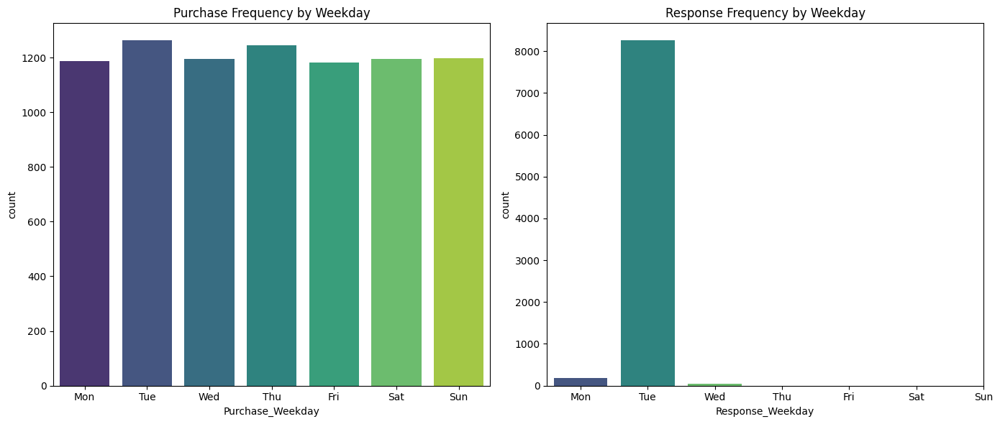

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot Purchase Weekday Distribution
sns.countplot(x=df['Purchase_Weekday'], ax=axes[0],palette='viridis')
axes[0].set_title("Purchase Frequency by Weekday")
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

# Plot Response Weekday Distribution
sns.countplot(x=df['Response_Weekday'], ax=axes[1],palette='viridis')
axes[1].set_title("Response Frequency by Weekday")
axes[1].set_xticks(range(7))
axes[1].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

# Adjust layout
plt.tight_layout()
plt.show()


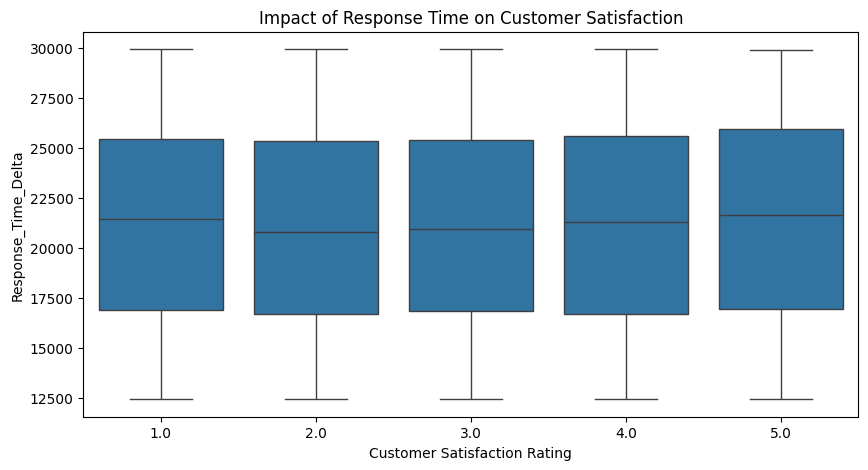

In [36]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df['Customer Satisfaction Rating'], y=df['Response_Time_Delta'])
plt.title("Impact of Response Time on Customer Satisfaction")
plt.show()


Identify Categorical Columns

In [37]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

print("Categorical Columns:")
print(categorical_columns)

Categorical Columns:
Index(['Customer Gender', 'Product Purchased', 'Ticket Type', 'Ticket Subject',
       'Ticket Status', 'Ticket Priority', 'Ticket Channel'],
      dtype='object')


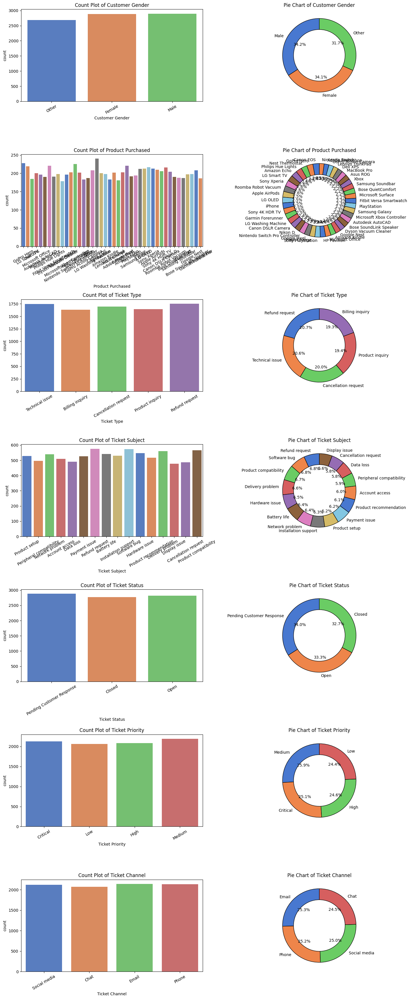

In [38]:
import matplotlib.pyplot as plt

# List of categorical columns
categorical_columns = ['Customer Gender', 'Product Purchased', 'Ticket Type', 'Ticket Subject',
       'Ticket Status', 'Ticket Priority', 'Ticket Channel']


# Plot count plots and pie charts
fig, axes = plt.subplots(len(categorical_columns), 2, figsize=(15, 5 * len(categorical_columns)))

for i, column in enumerate(categorical_columns):
    # Count plot
    sns.countplot(data=df, x=column, ax=axes[i, 0], palette='muted')
    axes[i, 0].set_title(f"Count Plot of {column}")
    axes[i, 0].tick_params(axis='x', rotation=30)

    # Pie chart
    df[column].value_counts().plot.pie(
        ax=axes[i, 1],
        autopct='%1.1f%%', 
        startangle=90, 
        colors=sns.color_palette('muted'),
        labels=df[column].value_counts().index, wedgeprops={'edgecolor': 'black', 'width': 0.3}
    )
    axes[i, 1].set_ylabel('')  # Remove y-axis label for the pie chart
    axes[i, 1].set_title(f"Pie Chart of {column}")

plt.tight_layout()
plt.show()

In [39]:
df['Product Purchased']

0                   GoPro Hero
1                  LG Smart TV
2                     Dell XPS
3             Microsoft Office
4             Autodesk AutoCAD
                 ...          
8464                   LG OLED
8465    Bose SoundLink Speaker
8466       GoPro Action Camera
8467               PlayStation
8468        Philips Hue Lights
Name: Product Purchased, Length: 8469, dtype: object

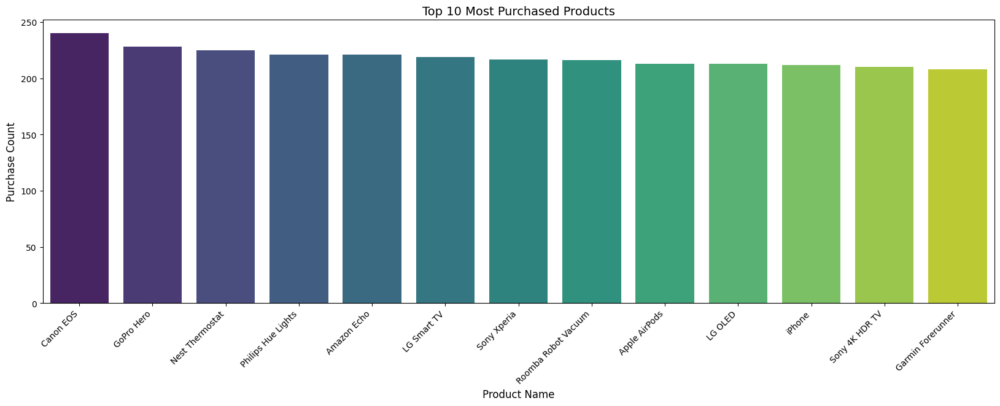

In [40]:

top_products = df['Product Purchased'].value_counts().nlargest(13)

# Set plot size
plt.figure(figsize=(20, 6))

# Create vertical bar plot
sns.barplot(x=top_products.index, y=top_products.values, palette='viridis')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add title and labels
plt.title('Top 10 Most Purchased Products', fontsize=14)
plt.xlabel('Product Name', fontsize=12)
plt.ylabel('Purchase Count', fontsize=12)

# Show plot
plt.show()


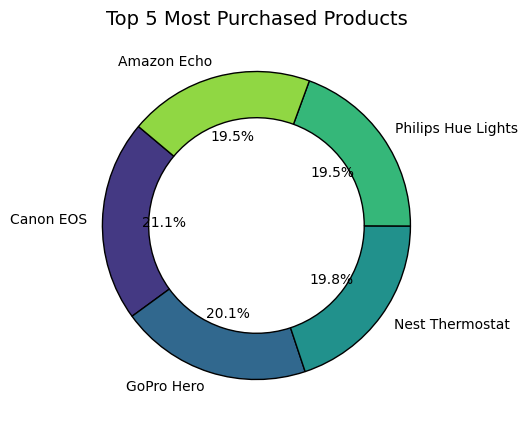

In [41]:
import matplotlib.pyplot as plt

# Get the top 13 purchased products
top_products = df['Product Purchased'].value_counts().nlargest(5)

# Set figure size
plt.figure(figsize=(5, 5))

# Create pie chart
plt.pie(
    top_products.values, 
    labels=top_products.index, 
    autopct='%1.1f%%',  # Show percentage
    colors=sns.color_palette('viridis', len(top_products)), 
    startangle=140,  # Rotate for better view
     wedgeprops={'edgecolor': 'black', 'width': 0.3}  # Add border for clarity
)

# Add title
plt.title('Top 5 Most Purchased Products', fontsize=14)

# Show plot
plt.show()


Identify Numerical Columns

In [42]:
# Identify numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64','int32']).columns
numerical_columns

Index(['Customer Age', 'Customer Satisfaction Rating', 'Purchase_Year',
       'Purchase_Month', 'Purchase_Day', 'Purchase_Weekday', 'Response_Hour',
       'Response_Minute', 'Response_Second', 'Response_Weekday', 'hour',
       'day_of_week', 'Response_Time_Delta'],
      dtype='object')

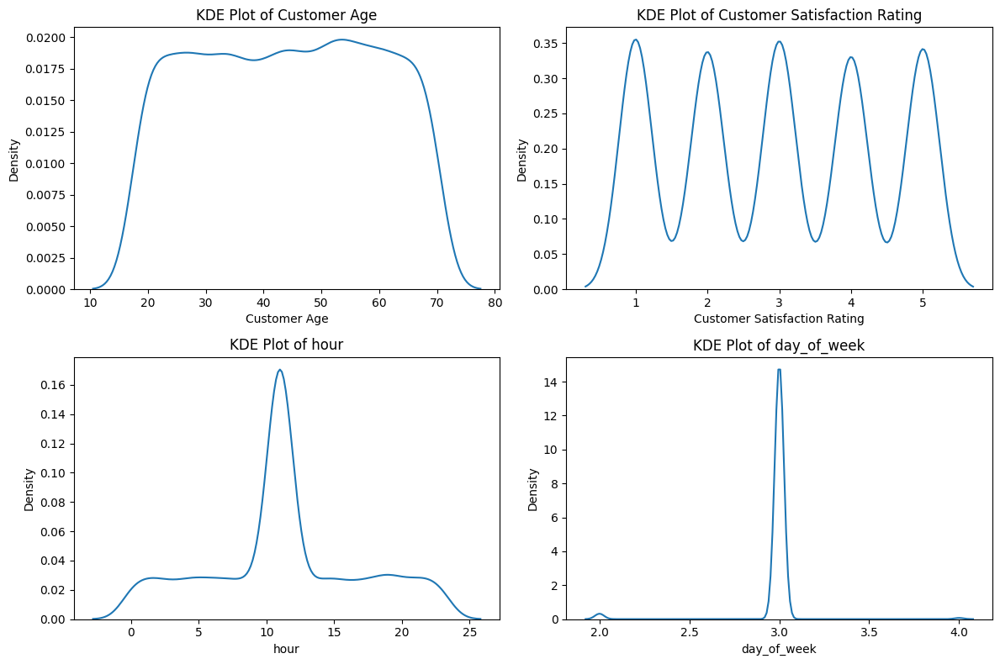

In [43]:
# Selected features
features = ['Customer Age', 'Customer Satisfaction Rating', 'hour', 'day_of_week']

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot KDE for each feature
for i, feature in enumerate(features):
    sns.kdeplot(df[feature], ax=axes[i], fill=False)
    axes[i].set_title(f'KDE Plot of {feature}')

plt.tight_layout()
plt.show()


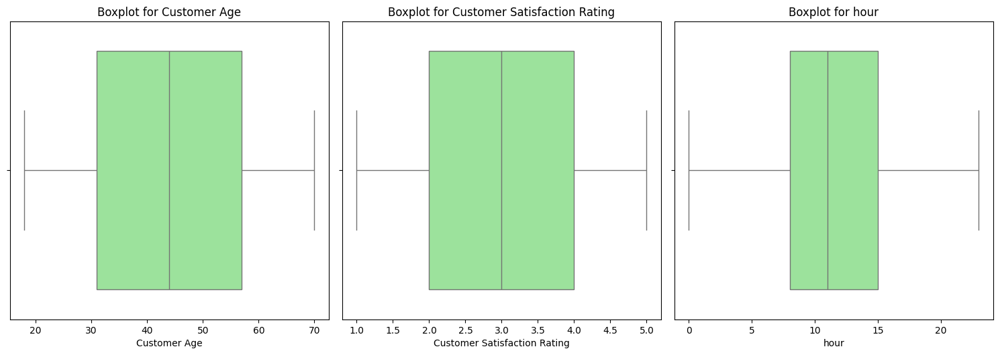

In [44]:
# List of numerical columns
numerical_columns =  ['Customer Age', 'Customer Satisfaction Rating', 'hour']

# Create a figure with subplots for each column
plt.figure(figsize=(15, 10))  # Adjust size based on the number of columns

# Loop through numerical columns and plot boxplots
for i, col in enumerate(numerical_columns, 1):  # Start index at 1 for subplot
    plt.subplot(2, 3, i)  # Create subplots (rows, columns, index)
    sns.boxplot(data=df, x=col, color="lightgreen")
    plt.title(f"Boxplot for {col}")
    plt.xlabel(col)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

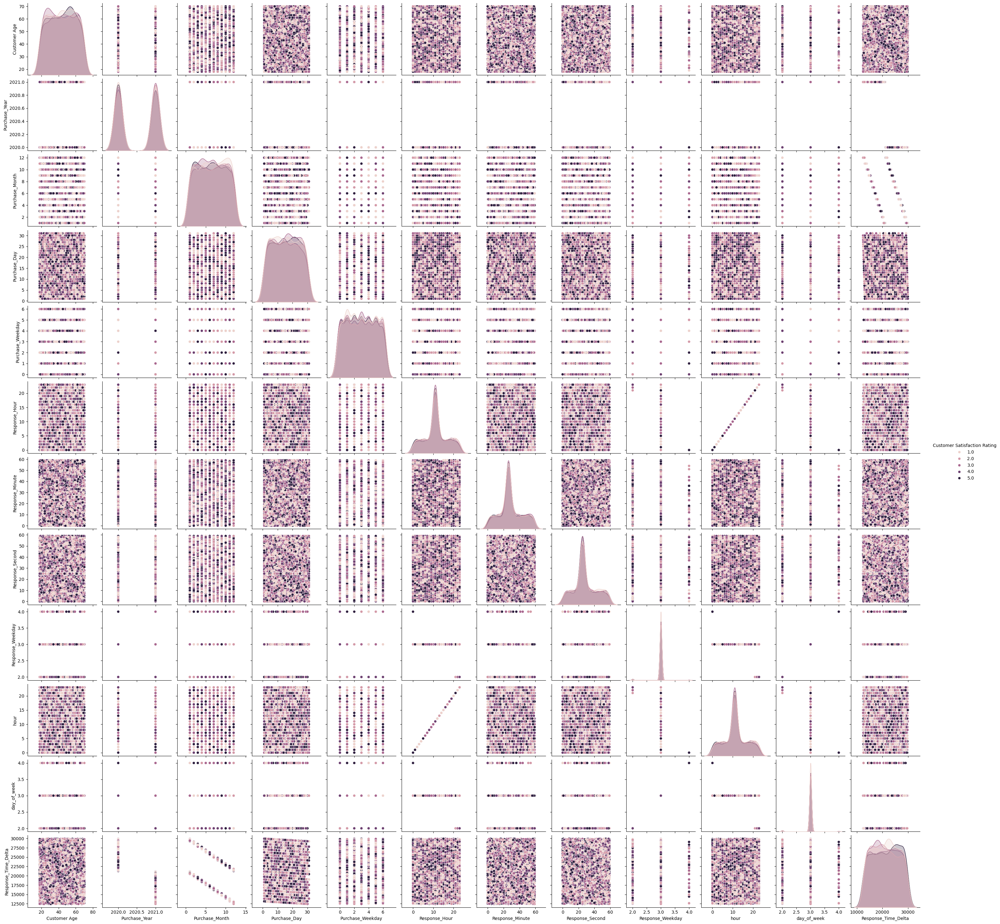

In [45]:
# Create a pairplot for the numerical columns
sns.pairplot(df,hue = 'Customer Satisfaction Rating')

# Show the plot
plt.show()

In [46]:
df.head()

,Customer Age,Customer Gender,Product Purchased,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,Customer Satisfaction Rating,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
0,32,Other,GoPro Hero,Technical issue,Product setup,Pending Customer Response,Critical,Social media,3.0,2021,3,22,0,12,15,36,3,12,3,19236.260000
1,42,Female,LG Smart TV,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,5.0,2021,5,22,5,16,45,38,3,16,3,17776.760556
2,48,Other,Dell XPS,Technical issue,Network problem,Closed,Low,Social media,3.0,2020,7,14,1,11,14,38,3,11,3,25259.243889
3,27,Female,Microsoft Office,Billing inquiry,Account access,Closed,Low,Social media,3.0,2020,11,13,4,7,29,40,3,7,3,22327.494444
4,67,Female,Autodesk AutoCAD,Billing inquiry,Data loss,Closed,Low,Email,1.0,2020,2,4,1,0,12,42,3,0,3,29112.211667


In [47]:
df['Customer Satisfaction Rating']

0       3.0
1       5.0
2       3.0
3       3.0
4       1.0
       ... 
8464    2.0
8465    1.0
8466    3.0
8467    3.0
8468    4.0
Name: Customer Satisfaction Rating, Length: 8469, dtype: float64

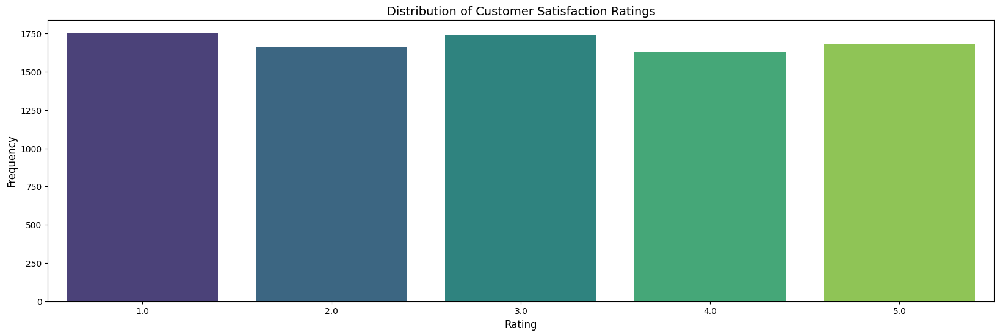

In [48]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Customer Satisfaction Rating', data=df, palette='viridis')
plt.title('Distribution of Customer Satisfaction Ratings', fontsize=14)
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()


In [49]:
correlation_matrix =df.describe().corr()
correlation_matrix

,Customer Age,Customer Satisfaction Rating,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
Customer Age,1.000000,0.999983,0.959623,0.999987,0.999994,0.999984,0.999991,0.999998,0.999998,0.999983,0.999991,0.999983,-0.426372
Customer Satisfaction Rating,0.999983,1.000000,0.958734,1.000000,0.999996,1.000000,0.999998,0.999986,0.999986,1.000000,0.999998,1.000000,-0.431440
Purchase_Year,0.959623,0.958734,1.000000,0.958785,0.958911,0.958715,0.958869,0.959150,0.959139,0.958776,0.958869,0.958776,-0.225741
Purchase_Month,0.999987,1.000000,0.958785,1.000000,0.999998,1.000000,0.999999,0.999990,0.999989,0.999999,0.999999,0.999999,-0.430856
Purchase_Day,0.999994,0.999996,0.958911,0.999998,1.000000,0.999997,1.000000,0.999996,0.999996,0.999996,1.000000,0.999996,-0.429423
Purchase_Weekday,0.999984,1.000000,0.958715,1.000000,0.999997,1.000000,0.999999,0.999987,0.999987,1.000000,0.999999,1.000000,-0.431338
Response_Hour,0.999991,0.999998,0.958869,0.999999,1.000000,0.999999,1.000000,0.999994,0.999994,0.999998,1.000000,0.999998,-0.430066
Response_Minute,0.999998,0.999986,0.959150,0.999990,0.999996,0.999987,0.999994,1.000000,1.000000,0.999985,0.999994,0.999985,-0.427409
Response_Second,0.999998,0.999986,0.959139,0.999989,0.999996,0.999987,0.999994,1.000000,1.000000,0.999985,0.999994,0.999985,-0.427435
Response_Weekday,0.999983,1.000000,0.958776,0.999999,0.999996,1.000000,0.999998,0.999985,0.999985,1.000000,0.999998,1.000000,-0.431490


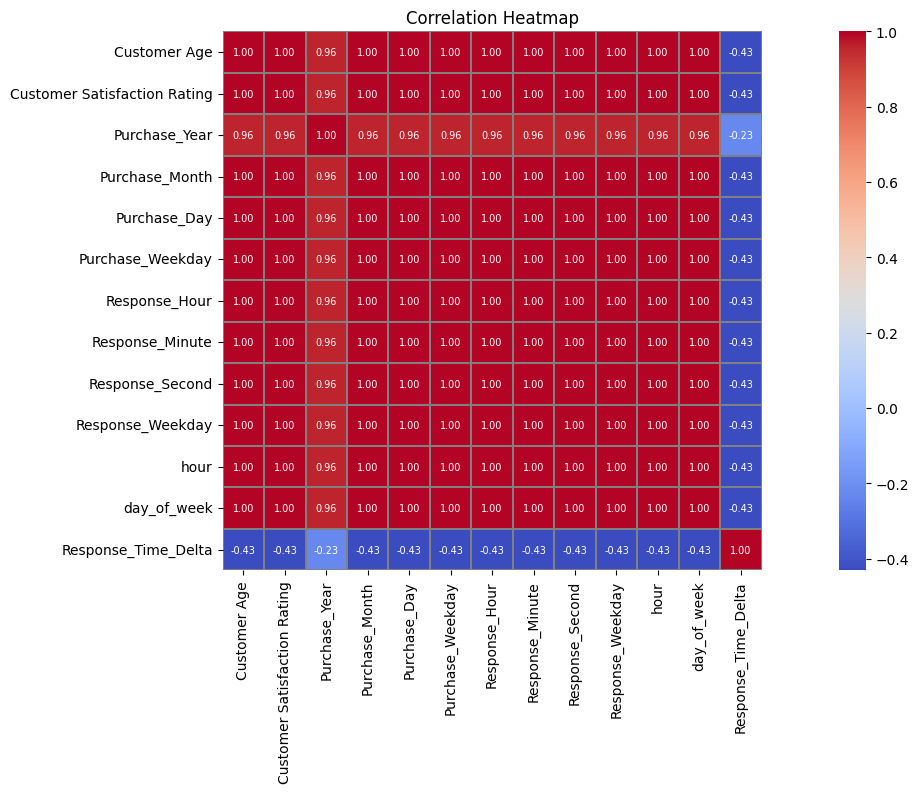

In [50]:
plt.figure(figsize=(20, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True,linewidths=0.3,linecolor='gray',annot_kws={"size": 7},fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

buliding the Model

In [51]:
df.head()


,Customer Age,Customer Gender,Product Purchased,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,Customer Satisfaction Rating,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
0,32,Other,GoPro Hero,Technical issue,Product setup,Pending Customer Response,Critical,Social media,3.0,2021,3,22,0,12,15,36,3,12,3,19236.260000
1,42,Female,LG Smart TV,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,5.0,2021,5,22,5,16,45,38,3,16,3,17776.760556
2,48,Other,Dell XPS,Technical issue,Network problem,Closed,Low,Social media,3.0,2020,7,14,1,11,14,38,3,11,3,25259.243889
3,27,Female,Microsoft Office,Billing inquiry,Account access,Closed,Low,Social media,3.0,2020,11,13,4,7,29,40,3,7,3,22327.494444
4,67,Female,Autodesk AutoCAD,Billing inquiry,Data loss,Closed,Low,Email,1.0,2020,2,4,1,0,12,42,3,0,3,29112.211667


In [52]:
# Drop column 'B'
X = df.drop('Customer Satisfaction Rating', axis=1)
y = df['Customer Satisfaction Rating'] 

In [53]:
X.head(2)

,Customer Age,Customer Gender,Product Purchased,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
0,32,Other,GoPro Hero,Technical issue,Product setup,Pending Customer Response,Critical,Social media,2021,3,22,0,12,15,36,3,12,3,19236.260000
1,42,Female,LG Smart TV,Technical issue,Peripheral compatibility,Pending Customer Response,Critical,Chat,2021,5,22,5,16,45,38,3,16,3,17776.760556


In [54]:
df['Product Purchased']

0                   GoPro Hero
1                  LG Smart TV
2                     Dell XPS
3             Microsoft Office
4             Autodesk AutoCAD
                 ...          
8464                   LG OLED
8465    Bose SoundLink Speaker
8466       GoPro Action Camera
8467               PlayStation
8468        Philips Hue Lights
Name: Product Purchased, Length: 8469, dtype: object

In [55]:
y.head()

0    3.0
1    5.0
2    3.0
3    3.0
4    1.0
Name: Customer Satisfaction Rating, dtype: float64

In [56]:
print(f"shape : {X.shape} , shape : {y.shape} ")

shape : (8469, 19) , shape : (8469,) 


In [57]:
# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [58]:
print("X_train shape:",X_train.shape,"X_test shape :",X_test.shape ,"y_train shape :",y_train.shape,"y_test shape : ",y_test.shape)

X_train shape: (6775, 19) X_test shape : (1694, 19) y_train shape : (6775,) y_test shape :  (1694,)


In [59]:
print(numerical_columns)
print()
print(categorical_columns)

['Customer Age', 'Customer Satisfaction Rating', 'hour']

['Customer Gender', 'Product Purchased', 'Ticket Type', 'Ticket Subject', 'Ticket Status', 'Ticket Priority', 'Ticket Channel']


In [60]:
import pandas as pd
print(pd.Series(y_train).value_counts())


Customer Satisfaction Rating
1.0    1403
3.0    1389
5.0    1352
2.0    1334
4.0    1297
Name: count, dtype: int64


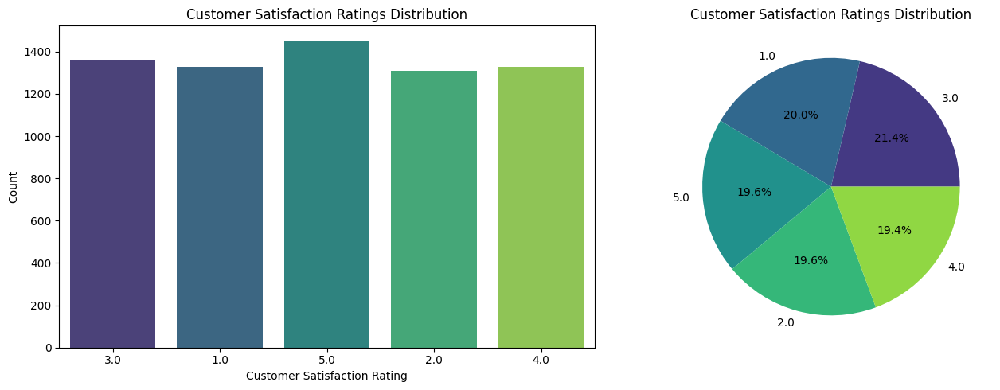

In [61]:
#  The is data balanced 
# Data
ratings = [3.0, 1.0, 5.0, 2.0, 4.0]
counts = [1450, 1358, 1329, 1327, 1311]

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot
sns.barplot(x=ratings, y=counts, palette="viridis", ax=axes[0])
axes[0].set_xlabel("Customer Satisfaction Rating")
axes[0].set_ylabel("Count")
axes[0].set_title("Customer Satisfaction Ratings Distribution")
axes[0].set_xticks(range(len(ratings)))
axes[0].set_xticklabels(ratings)

# Pie chart
axes[1].pie(counts, labels=ratings, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(ratings)))
axes[1].set_title("Customer Satisfaction Ratings Distribution")

# Adjust layout
plt.tight_layout()
plt.show()



In [62]:
X_train.head()

,Customer Age,Customer Gender,Product Purchased,Ticket Type,Ticket Subject,Ticket Status,Ticket Priority,Ticket Channel,Purchase_Year,Purchase_Month,Purchase_Day,Purchase_Weekday,Response_Hour,Response_Minute,Response_Second,Response_Weekday,hour,day_of_week,Response_Time_Delta
2794,26,Other,Dell XPS,Cancellation request,Peripheral compatibility,Pending Customer Response,Medium,Chat,2021,1,14,3,8,18,4,3,8,3,20840.301111
7497,23,Female,Philips Hue Lights,Cancellation request,Delivery problem,Pending Customer Response,Critical,Social media,2021,1,11,0,21,47,58,3,21,3,20925.799444
7646,27,Other,Canon DSLR Camera,Billing inquiry,Hardware issue,Closed,High,Phone,2021,3,28,6,20,36,15,3,20,3,19100.604167
2726,20,Female,Microsoft Surface,Product inquiry,Payment issue,Closed,Medium,Phone,2021,12,27,0,14,36,34,3,14,3,12518.609444
4348,21,Male,iPhone,Refund request,Hardware issue,Pending Customer Response,Low,Phone,2021,8,1,6,1,47,37,3,1,3,16057.793611


In [63]:
numerical_columns = ['Customer Age','hour','day_of_week','Purchase_Month','Purchase_Day','Purchase_Weekday','Response_Hour','Response_Minute','Response_Second','Response_Weekday','Response_Time_Delta']
categorical_Ordinal_features = ['Ticket Priority']
categorical_normial_features = ['Customer Gender','Product Purchased','Ticket Type']

In [64]:
# Preprocessing for numerical data (Standard scaling) and categorical data (One-Hot Encoding)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_columns),
        ('ohe', OneHotEncoder(sparse_output=False,handle_unknown='ignore'),categorical_normial_features), 

        ('ord', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),categorical_normial_features)
    ])

In [65]:
# Modify preprocessing to include
preprocessor_with_pca = Pipeline(steps=[
    ("preprocessor", preprocessor),  # Preprocess categorical & numerical features
    ("pca", PCA(n_components=20))  # PCA step
])

In [66]:
preprocessor_with_pca

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Customer Age', 'hour',
                                                   'day_of_week',
                                                   'Purchase_Month',
                                                   'Purchase_Day',
                                                   'Purchase_Weekday',
                                                   'Response_Hour',
                                                   'Response_Minute',
                                                   'Response_Second',
                                                   'Response_Weekday',
                                                   'Response_Time_Delta']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Customer Gender',
                                                   'Product Purchased',
                                                   'Ticket Type']),
                                                 ('ord',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['Customer Gender',
                                                   'Product Purchased',
                                                   'Ticket Type'])])),
                ('pca', PCA(n_components=20))])

In [67]:
# Dictionary of all classifiers
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Hist Gradient Boosting": HistGradientBoostingClassifier(),
    "Support Vector Classifier": SVC(),
    "Linear SVC": LinearSVC(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Gaussian Naive Bayes": GaussianNB(),
    "Bernoulli Naive Bayes": BernoulliNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis": QuadraticDiscriminantAnalysis()
}


In [ ]:
# Define hyperparameters for tuning
param_grid = {
    "Logistic Regression": {"solver": ["liblinear"], "penalty": ["l1", "l2"], "C": [0.1, 1, 10]},
    "Random Forest": {"n_estimators": [50, 100, 200], "max_depth": [None, 10, 20], "criterion": ["gini", "entropy"]},
    "Gradient Boosting": {"n_estimators": [50, 100, 200], "learning_rate": [0.01, 0.1, 0.5], "max_depth": [3, 5, 10]},
    "AdaBoost": {"n_estimators": [50, 100, 200], "learning_rate": [0.01, 0.1, 1.0]},
    "Hist Gradient Boosting": {"max_iter": [50, 100, 200], "learning_rate": [0.01, 0.1, 0.5], "max_depth": [3, 5, 10]},
    "Support Vector Classifier": {"kernel": ["linear", "rbf", "sigmoid"], "C": [0.1, 1, 10], "gamma": ["scale", "auto"]},
    "Linear SVC": {"C": [0.1, 1, 10], "loss": ["hinge", "squared_hinge"]},
    "K-Nearest Neighbors": {"n_neighbors": [3, 5, 7], "weights": ["uniform", "distance"], "metric": ["euclidean", "manhattan"]},
    "Gaussian Naive Bayes": {"var_smoothing": [1e-9, 1e-8, 1e-7]},
    "Bernoulli Naive Bayes": {"alpha": [0.1, 0.5, 1.0, 1.5]},
    "Decision Tree": {"max_depth": [3, 5, 10, None], "criterion": ["gini", "entropy"]},
    "Linear Discriminant Analysis": {"solver": ["svd", "lsqr", "eigen"]},  
    "Quadratic Discriminant Analysis": {"reg_param": [0.0, 0.1, 0.5, 1.0]}
}

In [69]:
# param_grid = {
#     "Logistic Regression": {},
#     "Random Forest": {},
#     "Gradient Boosting": {},
#     "AdaBoost": {},
#     "Hist Gradient Boosting": {},
#     "Support Vector Classifier": {},
#     "Linear SVC": {},
#     "K-Nearest Neighbors": {},
#     "Gaussian Naive Bayes": {},
#     "Bernoulli Naive Bayes": {},
#     "Decision Tree": {},
#     "Linear Discriminant Analysis": {},
#     "Quadratic Discriminant Analysis": {}
# }


In [70]:
for name, clf in classifiers.items():
    try:
        # Retrieve hyperparameters from param_grid
        param_grid_for_clf = param_grid.get(name, {})
         # Create a pipeline with PCA
        pipeline = Pipeline(steps=[
            ("preprocessor", preprocessor_with_pca),
            ("classifier", clf)
        ])

        
        # Randomized Search for Hyperparameter Tuning
        random_search = RandomizedSearchCV(
            estimator=pipeline,
            param_distributions={"classifier__" + key: value for key, value in param_grid_for_clf.items()},
            n_iter=10,
            scoring='f1_weighted',
            cv=3,
            random_state=42,
            verbose=1,
            n_jobs=-1
        )
        
        # Fit the model
        random_search.fit(X_train, y_train)
        
        # Get best estimator and predictions
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Evaluate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')
        mean_cv_score = random_search.best_score_

        # Print results
        print(f"\nClassifier: {name}")
        print(f"Best Parameters: {random_search.best_params_}")
        print(f"Mean CV Score: {mean_cv_score:.2f}")
        print(f"Accuracy: {accuracy:.2f}")
        print(f"Precision: {precision:.2f}")
        print(f"Recall: {recall:.2f}")
        print(f"F1 Score: {f1:.2f}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("Confusion Matrix:")
        print(confusion_matrix(y_test, y_pred))
        print("-" * 80)

    except Exception as e:
        print(f"Error with {name}: {e}")


Fitting 3 folds for each of 6 candidates, totalling 18 fits

Classifier: Logistic Regression
Best Parameters: {'classifier__solver': 'liblinear', 'classifier__penalty': 'l2', 'classifier__C': 1}
Mean CV Score: 0.21
Accuracy: 0.21
Precision: 0.21
Recall: 0.21
F1 Score: 0.21
Classification Report:
              precision    recall  f1-score   support

         1.0       0.21      0.27      0.24       349
         2.0       0.21      0.17      0.19       330
         3.0       0.21      0.30      0.25       350
         4.0       0.17      0.13      0.15       332
         5.0       0.26      0.18      0.21       333

    accuracy                           0.21      1694
   macro avg       0.21      0.21      0.21      1694
weighted avg       0.21      0.21      0.21      1694

Confusion Matrix:
[[ 95  56  98  64  36]
 [ 88  57  95  51  39]
 [ 87  60 104  47  52]
 [ 84  65  93  44  46]
 [ 93  30 103  47  60]]
--------------------------------------------------------------------------------

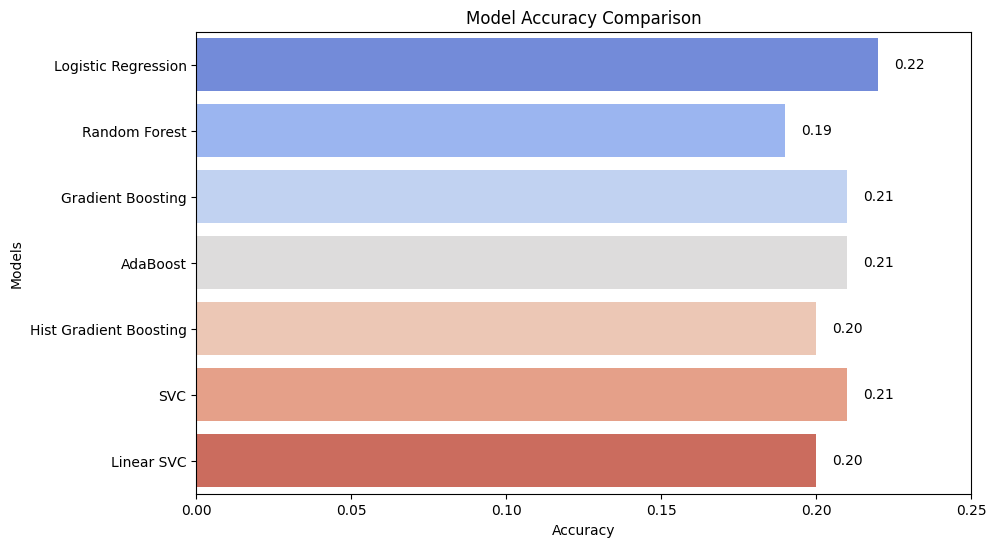

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

# Model names and their corresponding accuracies
models = [
    "Logistic Regression", "Random Forest", "Gradient Boosting", 
    "AdaBoost", "Hist Gradient Boosting", "SVC", "Linear SVC"
]
accuracies = [0.22, 0.19, 0.21, 0.21, 0.20, 0.21, 0.20]

# Create a horizontal bar plot
plt.figure(figsize=(10, 6))
sns.barplot(y=models, x=accuracies, palette="coolwarm")

# Formatting the plot
plt.xlabel("Accuracy")
plt.ylabel("Models")
plt.title("Model Accuracy Comparison")
plt.xlim(0, 0.25)  # Adjusting the scale for better visibility

# Display the values on top of bars
for i, acc in enumerate(accuracies):
    plt.text(acc + 0.005, i, f"{acc:.2f}", va='center')

plt.show()
